# Typical SSOF analysis example using a previously fit SSOF model

## Importing packages

In [1]:
using Pkg
Pkg.activate(".")
Pkg.instantiate()

import StellarSpectraObservationFitting as SSOF

using JLD2  # importing saved model
using Plots  # plotting
using Statistics  # mean function

# approximating PDF of saved model scores
using KernelDensity  # Bandwidth calculation
using Distributions  # Normal distribution
using StatsBase  # sample function

include("../SSOFUtilities/plots.jl")  # some plotting functions
_plot(; dpi = 100, size = (960, 540), thickness_scaling=1., margin=4Plots.mm, kwargs...) =
    plot(; dpi=dpi, size=size, thickness_scaling=thickness_scaling, margin=margin, kwargs...)

  Activating project at `C:\Users\Christian\Dropbox\GP_research\julia\StellarSpectraObservationFitting\examples`
Precompiling project...
  ✓ StellarSpectraObservationFitting
  1 dependency successfully precompiled in 10 seconds (233 already precompiled)


_plot (generic function with 1 method)

## Simulating data

### Loading in model and data

In [2]:
# load in a prefit SSOF model and the data that it was fit to
@load "jld2/results.jld2" model
@load "jld2/data.jld2" data

1-element Vector{Symbol}:
 :data

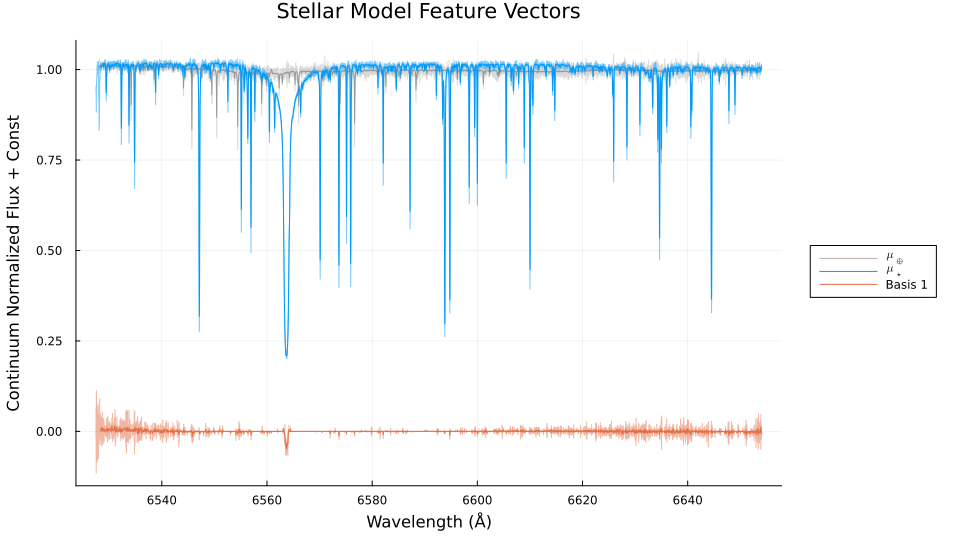

In [3]:
stellar=true
plot_bases(model, data, stellar)

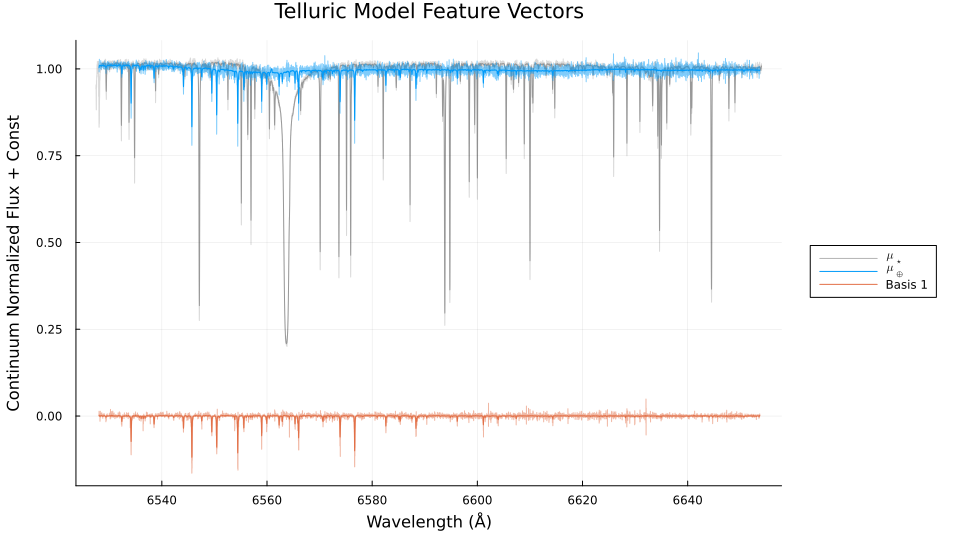

In [4]:
stellar=false
plot_bases(model, data, stellar)

### Making simulated stellar data

#### Setting number of observations, injected RVs, and desired SNR at center of order

In [5]:
# how many observations we want
n_simulated_observations = 50

# Adding whatever additional RVs we want
injected_rvs = zeros(n_simulated_observations)
# K = 10  # planet velocity semi-amplitude (m/s)
# P = 60  # planet period (d)
# injected_rvs = K .* sin(times ./ P * 2 * π)

# simulated central pixel SNR
desired_max_snr = 500;

#### Barycentric RVs
One could use barycorrpy to get realistic barycentric correction RVs (the code shown gets observations of HD 26965 from Kitt Peak) but we can also use a simpler epicyclic model

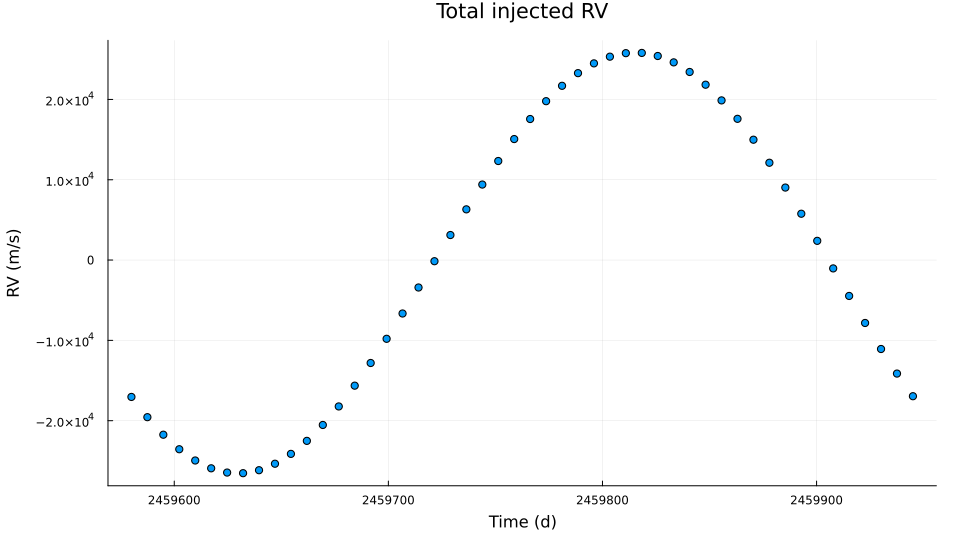

In [6]:
# spread observations evenly across all of 2022 (JD)
times = 2459580 .+ collect(LinRange(365., 0, n_simulated_observations));

# # Barycorrpy version
# using PyCall
# barycorrpy = PyNULL()
# # pyimport_conda("scipy", "scipy")
# # pushfirst!(PyVector(pyimport("sys")."path"), @__DIR__)
# copy!(barycorrpy , pyimport("barycorrpy") )
# barycentric_corrections = barycorrpy.get_BC_vel(JDUTC=times, hip_id=19849, obsname="KPNO", ephemeris="de430")
# barycentric_rvs = barycentric_corrections[1]

# Epicyclic approximation for simplicity (correct within 411 m/s)
year = 365.25
phases = times ./ year * 2 * π
design_matrix = hcat(cos.(phases), sin.(phases), cos.(2 .* phases), sin.(2 .* phases), ones(length(times)))
epicyclic_barycentric_rv_coefficients = [-20906.74122340397, -15770.355782489662, -390.29975114321905, -198.97407208182858, -67.99370656806558]
barycentric_rvs = design_matrix * epicyclic_barycentric_rv_coefficients

# observed wavelengths will just be the same as the original model
# could downsample here
log_λ_obs = model.tel.log_λ * (ones(n_simulated_observations)')
log_λ_stellar = log_λ_obs .+ (SSOF.rv_to_D(barycentric_rvs)')

plot_rv()
scatter!(times, barycentric_rvs + injected_rvs; label="", title="Total injected RV")

#### Sampling some typical stellar model scores

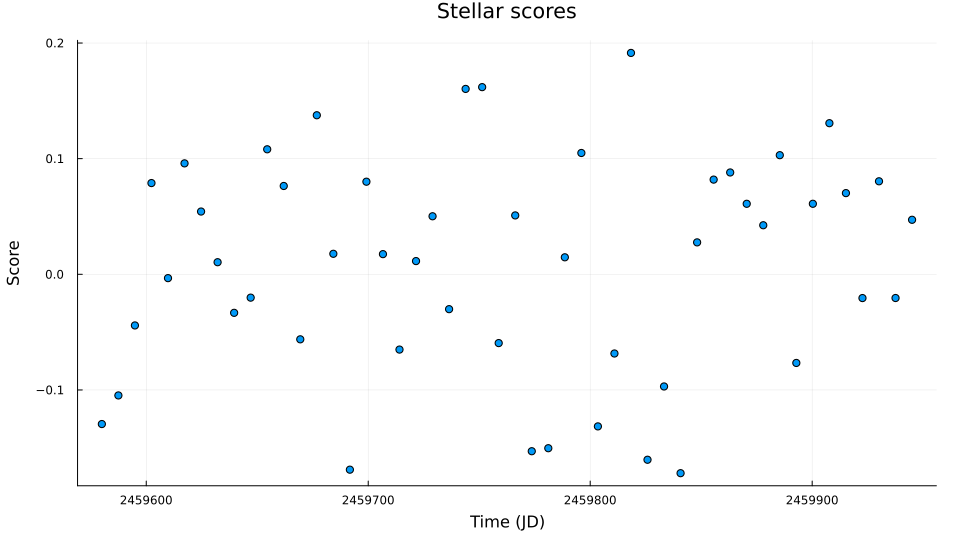

In [7]:
# getting stellar feature score values that roughly match the original modeled distribution
bandwidth_stellar = KernelDensity.default_bandwidth(vec(model.star.lm.s))
model_scores_stellar = rand.(Normal.(sample(vec(model.star.lm.s), n_simulated_observations; replace=true), bandwidth_stellar))'
plot_scores()
scatter!(times, model_scores_stellar'; label="", ylabel="Score", xlabel="Time (JD)", title="Stellar scores")

#### Evaluating the linear model and interpolating the simulated flux to the observed wavelengths

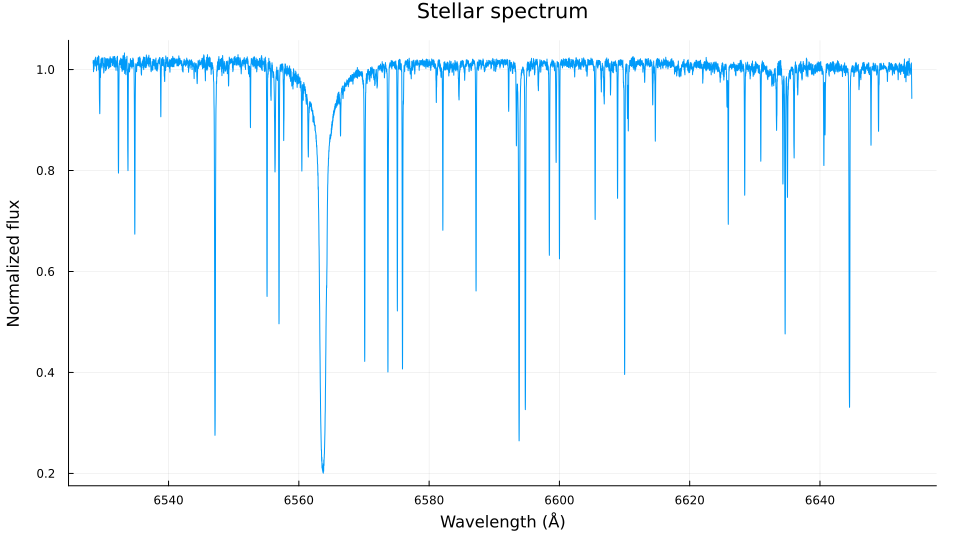

In [8]:
# evaluating linear model
_flux_stellar = SSOF._eval_lm(model.star.lm.M, model_scores_stellar, model.star.lm.μ; log_lm=model.star.lm.log)  # replace s for custom data

# interpolating stellar flux
b2o = SSOF.StellarInterpolationHelper(model.star.log_λ, injected_rvs + barycentric_rvs, log_λ_obs)
flux_stellar = SSOF.spectra_interp(_flux_stellar, injected_rvs + barycentric_rvs, b2o)

# plotting the first simulated stellar spectra
plot_spectrum()
plot!(exp.(log_λ_stellar[:, 1]), flux_stellar[:, 1]; label="", ylabel="Normalized flux", xlabel="Wavelength (Å)", title="Stellar spectrum")

### Making simulated telluric data

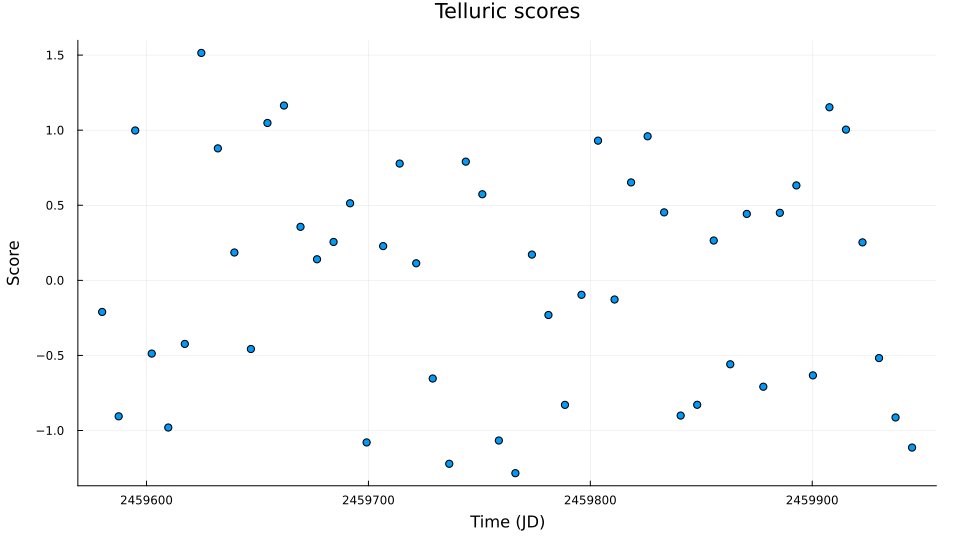

In [9]:
# getting telluric feature score values that roughly match the original modeled distribution
bandwidth_telluric = KernelDensity.default_bandwidth(vec(model.tel.lm.s))
model_scores_telluric = rand.(Normal.(sample(vec(model.tel.lm.s), n_simulated_observations; replace=true), bandwidth_telluric))'
plot_scores()
scatter!(times, model_scores_telluric'; label="", ylabel="Score", xlabel="Time (JD)", title="Telluric scores")

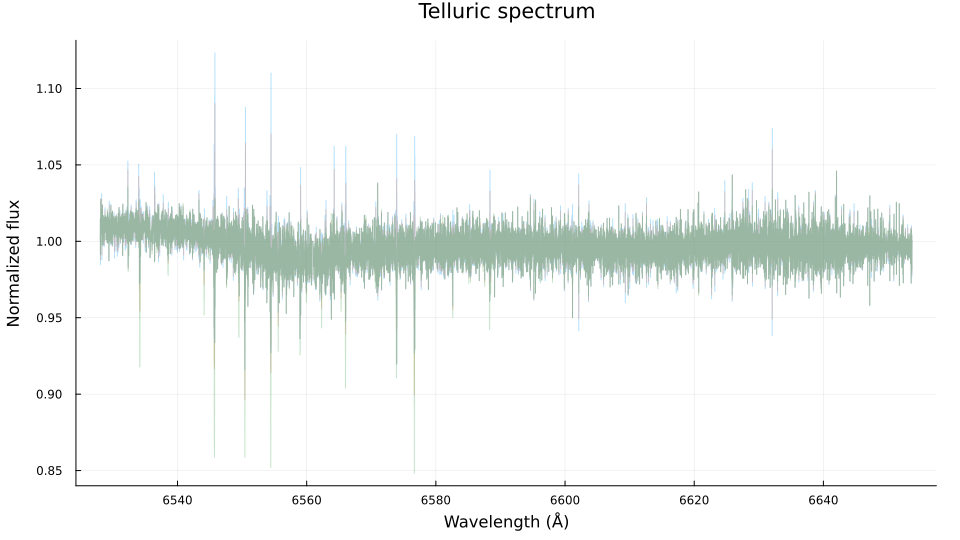

In [10]:
# simulated telluric transmission
flux_tellurics = SSOF._eval_lm(model.tel.lm.M, model_scores_telluric, model.tel.lm.μ; log_lm=model.tel.lm.log)

# plotting the first couple simulated telluric spectra
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1:3]), flux_tellurics[:, 1:3]; label="", ylabel="Normalized flux", title="Telluric spectrum", alpha=0.3)

### Combining stellar and telluric models

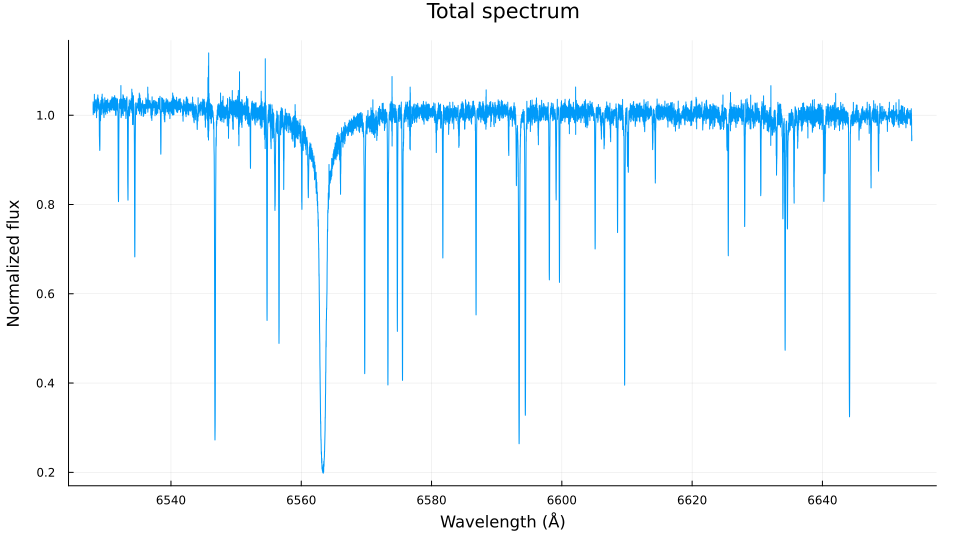

In [11]:
flux_total = SSOF.total_model(flux_tellurics, flux_stellar)

# plotting the first simulated combined spectra
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1]), flux_total[:, 1]; label="", ylabel="Normalized flux", title="Total spectrum")

#### Getting a realistic LSF

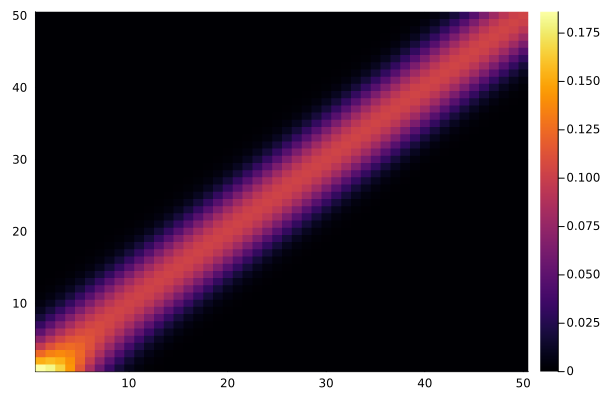

In [12]:
## getting a realistic LSF
include("../NEID/lsf.jl")  # defines NEIDLSF.NEID_lsf()
lsf_simulated = NEIDLSF.neid_lsf(81, vec(mean(data.log_λ_obs; dims=2)), vec(mean(log_λ_obs; dims=2)))
heatmap(Matrix(lsf_simulated[1:50, 1:50]))

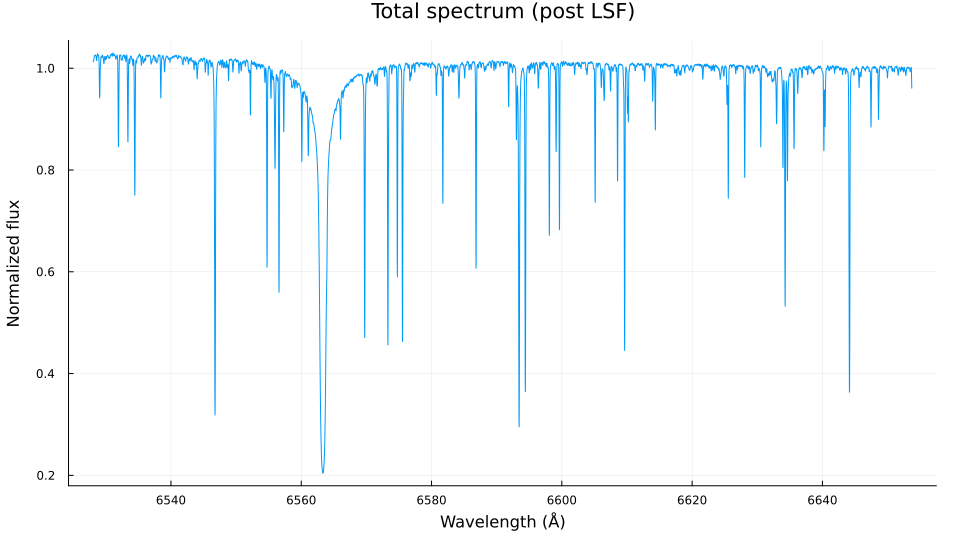

In [13]:
flux_total_lsf = lsf_simulated * flux_total

# plotting the first simulated combined spectra (post-LSF)
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1]), flux_total_lsf[:, 1]; label="", ylabel="Normalized flux", title="Total spectrum (post LSF)")

#### Getting a realistic blaze function (for variance scaling)

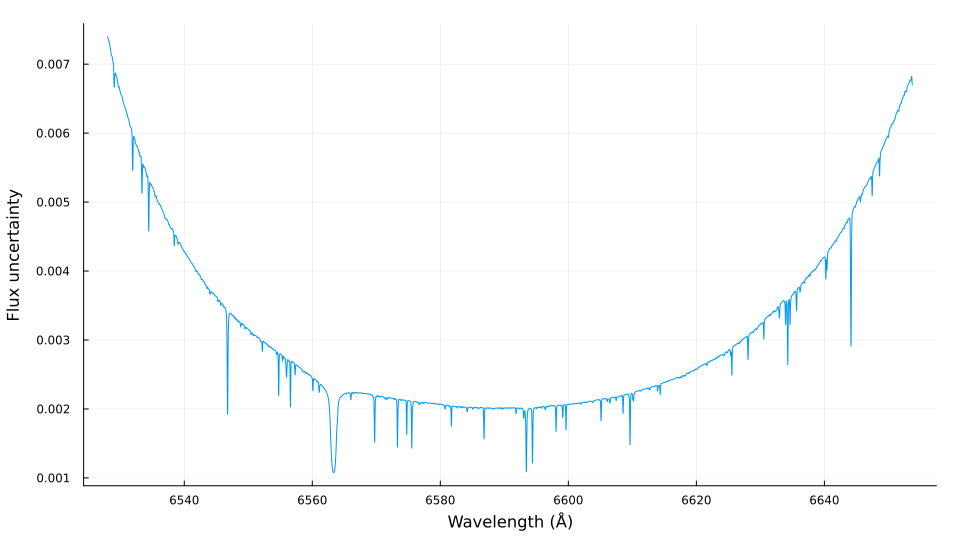

In [14]:
# measured_blaze = data.flux ./ data.var
# _, smooth_blazes = SSOF.calc_continuum(exp.(data.log_λ_obs), measured_blaze, data.var)
# smooth_blaze = vec(mean(smooth_blazes; dims=2))
# # filling in gaps
# lo = Inf
# for i in eachindex(smooth_blaze)
# 	if isfinite(smooth_blaze[i])
# 		if isfinite(lo)
# 			println("$lo, $i")
# 			smooth_blaze[lo:i] .= smooth_blaze[lo] .+ ((smooth_blaze[i]-smooth_blaze[lo]) * LinRange(0,1,i-lo+1))
# 			lo = Inf
# 		end
# 	elseif !isfinite(lo)
# 		lo = i-1
# 	end
# end
# using DataInterpolations
# blaze_function= DataInterpolations.LinearInterpolation(smooth_blaze, vec(mean(data.log_λ_obs; dims=2)))
# @save "examples/jld2/blaze.jld2" blaze_function
@load "jld2/blaze.jld2" blaze_function
var_total = flux_total_lsf ./ blaze_function.(log_λ_obs)

# scaling variance to have the desired SNR in the center
cp = Int(round(size(flux_total_lsf,1)/2))
snr_cp = median(flux_total_lsf[(cp-500):(cp+500),:] ./ sqrt.(var_total[(cp-500):(cp+500),:]))
var_total .*= (snr_cp / desired_max_snr)^2

# plotting the data uncertainties to be inserted into the first simulated spectra
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1]), sqrt.(var_total[:, 1]); ylabel="Flux uncertainty", label="")

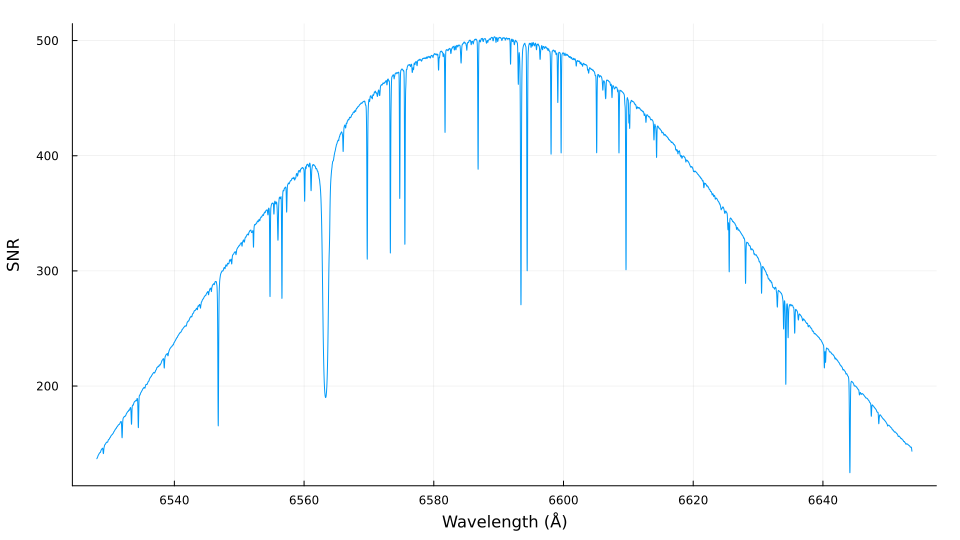

In [15]:
# plotting the SNR of the first simulated spectra
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1]), flux_total_lsf[:, 1] ./ sqrt.(var_total[:, 1]); ylabel="SNR", label="")

#### Adding photon noise

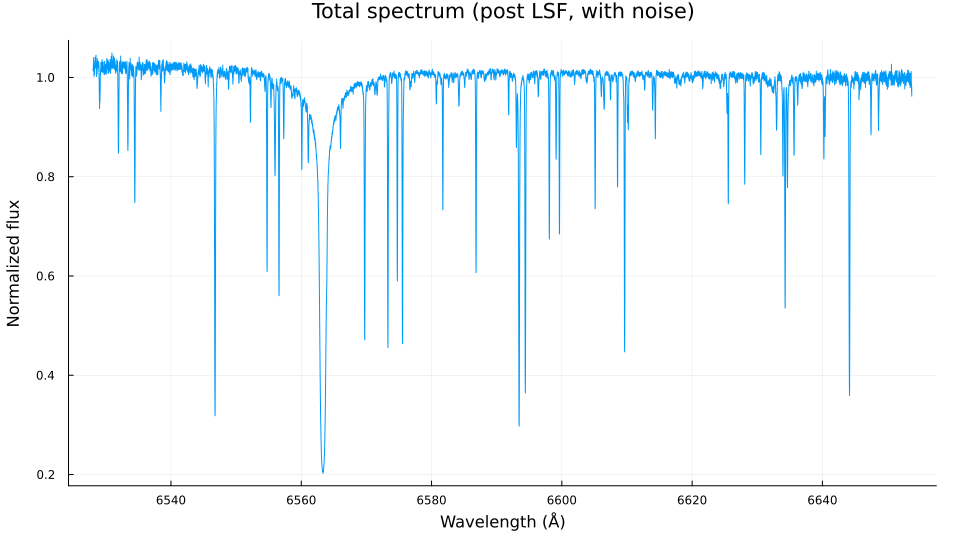

In [16]:
flux_noisy = flux_total_lsf .+ (randn(size(var_total)) .* sqrt.(var_total))
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1]), flux_noisy[:, 1]; label="", ylabel="Normalized flux", title="Total spectrum (post LSF, with noise)")

#### Collecting everything nicely for SSOF

In [17]:
data_simulated = SSOF.LSFData(flux_noisy, var_total, copy(var_total), log_λ_obs, log_λ_stellar, lsf_simulated) 
SSOF.mask_bad_edges!(data_simulated);

## Analyzing the simulated data

### Getting an initial model

In [ ]:
# getting initial model
star = "26965"
instrument = "SSOF"
order = 81

n_comp = 2  # maximum amount of feature vectors to use for each portion of the model

model_new = SSOF.calculate_initial_model(data_simulated; 
	instrument=instrument, desired_order=order, star=star, times=times,
	max_n_tel=n_comp, max_n_star=n_comp, log_λ_gp_star=1/SSOF.SOAP_gp_params.λ,
	log_λ_gp_tel=5.134684755671457e-6,
	tel_log_λ=model.tel.log_λ, star_log_λ=model.star.log_λ, oversamp=false)

# setting up model workspace
mws = SSOF.ModelWorkspace(model_new, data_simulated)

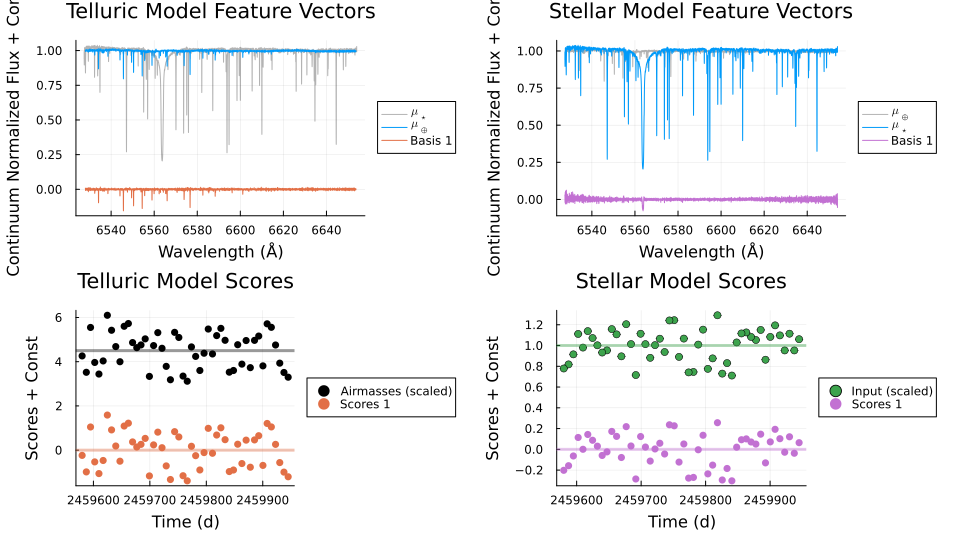

In [22]:
df_act = Dict([("Input", vec(model_scores_stellar)), ("Input_σ", zeros(length(model_scores_stellar)))])
plot_model(model_new, vec(model_scores_telluric), times; df_act=df_act, size=(960, 540));

### Fitting regularization

In [23]:
SSOF.fit_regularization!(mws)

ℓ:     712929.1069296047  ℓ_1/ℓ_0:       Inf
L2_Δ:  7.24876144015822e11  L2_Δ_1/L2_Δ_0: Inf

ℓ:     704394.9424917548  ℓ_2/ℓ_1:       0.9880294346872661
L2_Δ:  7.109098838420548e11  L2_Δ_2/L2_Δ_1: 0.9807329013527829

ℓ:     693616.878773637  ℓ_3/ℓ_2:       0.9846988343215654
L2_Δ:  4.832531140639334e11  L2_Δ_3/L2_Δ_2: 0.6797670493090223

ℓ:     683612.463855484  ℓ_4/ℓ_3:       0.985576454056537
L2_Δ:  3.012983709366548e11  L2_Δ_4/L2_Δ_3: 0.6234794193106713

ℓ:     678086.4608566652  ℓ_5/ℓ_4:       0.9919164683340427
L2_Δ:  2.584651047559925e11  L2_Δ_5/L2_Δ_4: 0.8578377106802626

ℓ:     673681.2130525721  ℓ_6/ℓ_5:       0.9935034128265477
L2_Δ:  2.012950221294435e11  L2_Δ_6/L2_Δ_5: 0.7788092799586189

ℓ:     670668.3053113252  ℓ_7/ℓ_6:       0.995527695172625
L2_Δ:  1.962861440731535e11  L2_Δ_7/L2_Δ_6: 0.9751167316344811

ℓ:     668866.6077628527  ℓ_8/ℓ_7:       0.9973135788075803
L2_Δ:  2.039065730921897e11  L2_Δ_8/L2_Δ_7: 1.0388230613781693

ℓ:     667273.5297793613  ℓ_9/ℓ_8:       0.

L2_Δ:  2.1086767932271498e8  L2_Δ_76/L2_Δ_75: 0.9508385721440599

ℓ:     644410.5053345452  ℓ_77/ℓ_76:       0.9998997961763404
L2_Δ:  1.8739010418234643e8  L2_Δ_77/L2_Δ_76: 0.8886620499842551

ℓ:     644347.4783313371  ℓ_78/ℓ_77:       0.9999021943269293
L2_Δ:  1.7557857040697208e8  L2_Δ_78/L2_Δ_77: 0.9369682095705506

ℓ:     644285.629513006  ℓ_79/ℓ_78:       0.99990401325308
L2_Δ:  1.6771590090704614e8  L2_Δ_79/L2_Δ_78: 0.9552185128190694

ℓ:     644224.6712195284  ℓ_80/ℓ_79:       0.9999053862282733
L2_Δ:  1.5341506017899266e8  L2_Δ_80/L2_Δ_79: 0.9147317538127795

ℓ:     644164.8312018132  ℓ_81/ℓ_80:       0.9999071131231253
L2_Δ:  1.4479095688706836e8  L2_Δ_81/L2_Δ_80: 0.943785810324864

starting regularization searches
initial training χ²: 221188.7664349123
reg_star[:GP_μ] : 0.001 -> 0.1
reg_star[:GP_μ] χ²: 224533.5122130721 -> 224180.62581529404 (0.998)
overall χ² change: 221188.7664349123 -> 224180.62581529404 (1.014)
reg_tel[:GP_μ] : 0.001 -> 0.001
reg_tel[:GP_μ] χ²: 224180.62

┌ Warning: weak local minimum 224180.62626707557 vs. 224180.6303350019
└ @ StellarSpectraObservationFitting C:\Users\Christian\Dropbox\GP_research\julia\StellarSpectraObservationFitting\src\regularization_functions.jl:115
┌ Warning: weak local minimum 219999.91202806658 vs. 219999.92490778607
└ @ StellarSpectraObservationFitting C:\Users\Christian\Dropbox\GP_research\julia\StellarSpectraObservationFitting\src\regularization_functions.jl:115


true

### Performing final fit

In [24]:
results = SSOF.improve_model!(mws; iter=500, verbose=true, careful_first_step=true, speed_up=false)

ℓ:     6.843933536755109e6  ℓ_1/ℓ_0:       10.624506656140225
L2_Δ:  6.993014483304275e13  L2_Δ_1/L2_Δ_0: 482973.1520290021

ℓ:     5.623599011985573e6  ℓ_2/ℓ_1:       0.8216910614026609
L2_Δ:  5.105104731057422e13  L2_Δ_2/L2_Δ_1: 0.7300291945978074

ℓ:     4.462555338330096e6  ℓ_3/ℓ_2:       0.793540814133272
L2_Δ:  3.401950026541256e13  L2_Δ_3/L2_Δ_2: 0.6663820246125702

ℓ:     3.6268247374199545e6  ℓ_4/ℓ_3:       0.8127237563348907
L2_Δ:  2.2725436249166074e13  L2_Δ_4/L2_Δ_3: 0.6680120540239358

ℓ:     3.114677746007821e6  ℓ_5/ℓ_4:       0.8587891534630747
L2_Δ:  1.6601147892529656e13  L2_Δ_5/L2_Δ_4: 0.7305095361211755

ℓ:     2.8252336224103435e6  ℓ_6/ℓ_5:       0.9070709244420335
L2_Δ:  1.3701490884296268e13  L2_Δ_6/L2_Δ_5: 0.8253339451582017

ℓ:     2.654623252805799e6  ℓ_7/ℓ_6:       0.9396119427960833
L2_Δ:  1.2317489396911477e13  L2_Δ_7/L2_Δ_6: 0.8989889860109281

ℓ:     2.530595512622109e6  ℓ_8/ℓ_7:       0.953278590454371
L2_Δ:  1.1404923154491035e13  L2_Δ_8/L2_Δ_7: 0.925912

ℓ:     766849.447257833  ℓ_75/ℓ_74:       0.9979600659832745
L2_Δ:  2.0417002416317368e10  L2_Δ_75/L2_Δ_74: 0.9485482976051068

ℓ:     765322.8010351965  ℓ_76/ℓ_75:       0.9980091969445951
L2_Δ:  1.935863990175744e10  L2_Δ_76/L2_Δ_75: 0.9481626884799661

ℓ:     763837.2698630688  ℓ_77/ℓ_76:       0.998058948237112
L2_Δ:  1.8348487353786106e10  L2_Δ_77/L2_Δ_76: 0.947819033098517

ℓ:     762393.381267226  ℓ_78/ℓ_77:       0.998109690829695
L2_Δ:  1.7399368122609238e10  L2_Δ_78/L2_Δ_77: 0.9482726170895487

ℓ:     760991.3736116879  ℓ_79/ℓ_78:       0.9981610442981448
L2_Δ:  1.652555222048853e10  L2_Δ_79/L2_Δ_78: 0.9497788715105552

ℓ:     759630.7900345151  ℓ_80/ℓ_79:       0.9982120906696808
L2_Δ:  1.5738773878081486e10  L2_Δ_80/L2_Δ_79: 0.9523901935675354

ℓ:     758310.3026489388  ℓ_81/ℓ_80:       0.9982616721137433
L2_Δ:  1.5039716732646536e10  L2_Δ_81/L2_Δ_80: 0.9555837607903823

ℓ:     757027.6966952769  ℓ_82/ℓ_81:       0.9983086001216368
L2_Δ:  1.4422296891643856e10  L2_Δ_82/L2_Δ

ℓ:     703188.8734992938  ℓ_149/ℓ_148:       0.9994585832039921
L2_Δ:  3.54004344769819e9  L2_Δ_149/L2_Δ_148: 0.9849928206921

ℓ:     702815.123232205  ℓ_150/ℓ_149:       0.9994684923479679
L2_Δ:  3.487198748802049e9  L2_Δ_150/L2_Δ_149: 0.9850723021689178

ℓ:     702448.231705832  ℓ_151/ℓ_150:       0.9994779686517191
L2_Δ:  3.435445328567538e9  L2_Δ_151/L2_Δ_150: 0.9851590276429497

ℓ:     702087.896776614  ℓ_152/ℓ_151:       0.9994870299148695
L2_Δ:  3.3846618697808495e9  L2_Δ_152/L2_Δ_151: 0.9852177945128694

ℓ:     701733.8439821074  ℓ_153/ℓ_152:       0.9994957144310105
L2_Δ:  3.3349784214579606e9  L2_Δ_153/L2_Δ_152: 0.9853210009642394

ℓ:     701385.8118819754  ℓ_154/ℓ_153:       0.9995040397394017
L2_Δ:  3.286291864538893e9  L2_Δ_154/L2_Δ_153: 0.9854012377993789

ℓ:     701043.5574450986  ℓ_155/ℓ_154:       0.9995120311373873
L2_Δ:  3.2386254912662954e9  L2_Δ_155/L2_Δ_154: 0.9854953926074105

ℓ:     700706.8661075667  ℓ_156/ℓ_155:       0.9995197283621592
L2_Δ:  3.19192164581838

L2_Δ:  1.5466256085178306e9  L2_Δ_222/L2_Δ_221: 0.9916421487646376

ℓ:     685370.4065084122  ℓ_223/ℓ_222:       0.9997617947308991
L2_Δ:  1.5338334282071757e9  L2_Δ_223/L2_Δ_222: 0.9917289742002178

ℓ:     685208.4019629023  ℓ_224/ℓ_223:       0.9997636248312277
L2_Δ:  1.5212020949880798e9  L2_Δ_224/L2_Δ_223: 0.9917648598688711

ℓ:     685047.6723472417  ℓ_225/ℓ_224:       0.9997654295901799
L2_Δ:  1.5087452500778847e9  L2_Δ_225/L2_Δ_224: 0.9918111834376006

ℓ:     684888.2015590512  ℓ_226/ℓ_225:       0.9997672121304433
L2_Δ:  1.49648519568383e9  L2_Δ_226/L2_Δ_225: 0.9918740063019772

ℓ:     684729.9722795496  ℓ_227/ℓ_226:       0.9997689706449295
L2_Δ:  1.484329437341419e9  L2_Δ_227/L2_Δ_226: 0.9918771275670012

ℓ:     684572.964948254  ℓ_228/ℓ_227:       0.999770701827506
L2_Δ:  1.4723984737949455e9  L2_Δ_228/L2_Δ_227: 0.9919620515188037

ℓ:     684417.1631527138  ℓ_229/ℓ_228:       0.9997724102418329
L2_Δ:  1.460647920700661e9  L2_Δ_229/L2_Δ_228: 0.9920194476540044

ℓ:     684262.

L2_Δ:  9.339041293484575e8  L2_Δ_295/L2_Δ_294: 0.9941735934957727

ℓ:     676051.3803334391  ℓ_296/ℓ_295:       0.9998495464066024
L2_Δ:  9.284785337069174e8  L2_Δ_296/L2_Δ_295: 0.9941904147641737

ℓ:     675950.1938890257  ℓ_297/ℓ_296:       0.9998503272867167
L2_Δ:  9.230936163970066e8  L2_Δ_297/L2_Δ_296: 0.9942002780738379

ℓ:     675849.5465221045  ℓ_298/ℓ_297:       0.9998511023921125
L2_Δ:  9.177503356846972e8  L2_Δ_298/L2_Δ_297: 0.994211550575807

ℓ:     675749.4342109683  ℓ_299/ℓ_298:       0.9998518718971532
L2_Δ:  9.124907062663486e8  L2_Δ_299/L2_Δ_298: 0.9942689975543026

ℓ:     675649.8537929055  ℓ_300/ℓ_299:       0.9998526370677925
L2_Δ:  9.072463516031266e8  L2_Δ_300/L2_Δ_299: 0.994252703477189

ℓ:     675550.799563865  ℓ_301/ℓ_300:       0.9998533941382738
L2_Δ:  9.020671146072417e8  L2_Δ_301/L2_Δ_300: 0.9942912561877675

ℓ:     675452.2658900518  ℓ_302/ℓ_301:       0.9998541432059932
L2_Δ:  8.969365998532578e8  L2_Δ_302/L2_Δ_301: 0.9943124910875198

ℓ:     675354.24888

ℓ:     669833.443871197  ℓ_369/ℓ_368:       0.9998926336165648
L2_Δ:  6.345842725586454e8  L2_Δ_369/L2_Δ_368: 0.995246482170687

ℓ:     669761.8263618886  ℓ_370/ℓ_369:       0.9998930816160886
L2_Δ:  6.316070578405576e8  L2_Δ_370/L2_Δ_369: 0.9953084013474149

ℓ:     669690.5124556873  ℓ_371/ℓ_370:       0.999893523483432
L2_Δ:  6.286278754427843e8  L2_Δ_371/L2_Δ_370: 0.9952831711413122

ℓ:     669619.4999115474  ℓ_372/ℓ_371:       0.9998939621469632
L2_Δ:  6.256752230987133e8  L2_Δ_372/L2_Δ_371: 0.9953030203409429

ℓ:     669548.7861814705  ℓ_373/ℓ_372:       0.9998943971463103
L2_Δ:  6.227301501412832e8  L2_Δ_373/L2_Δ_372: 0.9952929685422984

ℓ:     669478.369791868  ℓ_374/ℓ_373:       0.9998948300839973
L2_Δ:  6.198314201279404e8  L2_Δ_374/L2_Δ_373: 0.9953451265966726

ℓ:     669408.2479444641  ℓ_375/ℓ_374:       0.9998952589798745
L2_Δ:  6.16941128353345e8  L2_Δ_375/L2_Δ_374: 0.9953369711816178

ℓ:     669338.4189813242  ℓ_376/ℓ_375:       0.9998956855351658
L2_Δ:  6.140604551339929

L2_Δ:  4.596946920047833e8  L2_Δ_442/L2_Δ_441: 0.9958706528073323

ℓ:     665242.0235708689  ℓ_443/ℓ_442:       0.9999191964231737
L2_Δ:  4.5779286075898737e8  L2_Δ_443/L2_Δ_442: 0.9958628383601694

ℓ:     665188.4618201838  ℓ_444/ℓ_443:       0.9999194853169413
L2_Δ:  4.558986003462025e8  L2_Δ_444/L2_Δ_443: 0.9958621888300216

ℓ:     665135.0934995037  ℓ_445/ℓ_444:       0.999919769623583
L2_Δ:  4.540203426420515e8  L2_Δ_445/L2_Δ_444: 0.9958800976736392

ℓ:     665081.9187949087  ℓ_446/ℓ_445:       0.9999200542790259
L2_Δ:  4.521550663311463e8  L2_Δ_446/L2_Δ_445: 0.9958916459556619

ℓ:     665028.9362924016  ℓ_447/ℓ_446:       0.9999203368772932
L2_Δ:  4.502954462871029e8  L2_Δ_447/L2_Δ_446: 0.9958872073266088

ℓ:     664976.1450574873  ℓ_448/ℓ_447:       0.9999206181384999
L2_Δ:  4.4844877359689444e8  L2_Δ_448/L2_Δ_447: 0.9958989754272776

ℓ:     664923.5438822819  ℓ_449/ℓ_448:       0.999920897650846
L2_Δ:  4.466094024121098e8  L2_Δ_449/L2_Δ_448: 0.9958983694613958

ℓ:     664871.13

Time:  8.510999917984009 s
ℓ:     638152.9871647077
L∞(∇): 9.013108733979536e-5


Iter:  22
Time:  8.894000053405762 s
ℓ:     638152.9871647077
L∞(∇): 1.01086205018322e-5



 * Status: success

 * Candidate solution
    Final objective value:     6.381530e+05

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 4.81e-10 ≰ 0.0e+00
    |x - x'|/|x'|          = 1.88e-10 ≰ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 1.01e-05 ≰ 1.0e-08

 * Work counters
    Seconds run:   9  (vs limit Inf)
    Iterations:    22
    f(x) calls:    77
    ∇f(x) calls:   77


### Getting error bars

In [25]:
rvs, rvs_σ, tel_s_σ, star_s_σ = SSOF.estimate_σ_curvature(mws) # ~75% of bootstrap error bars
# rvs, rvs_σ, tel_s_σ, star_s_σ = SSOF.estimate_σ_bootstrap(mws)

done with 10/50 rv_σ estimates
done with 20/50 rv_σ estimates
done with 30/50 rv_σ estimates
done with 40/50 rv_σ estimates
done with 50/50 rv_σ estimates
done with 10/50 tel_s_σ estimates
done with 20/50 tel_s_σ estimates
done with 30/50 tel_s_σ estimates
done with 40/50 tel_s_σ estimates
done with 50/50 tel_s_σ estimates
done with 10/50 star_s_σ estimates
done with 20/50 star_s_σ estimates
done with 30/50 star_s_σ estimates
done with 40/50 star_s_σ estimates
done with 50/50 star_s_σ estimates


([-0.6541500970246816, 1.3203584850163836, -2.2759926880884036, 0.795478064273153, -1.392813627451859, 1.5989633811949018, -1.1154444463086137, -0.8150151334036986, 0.4461000497120846, -0.337551693836744  …  0.979262040520549, -1.6797383989243089, -0.9202649634718993, 0.5195483469742771, 1.6933290458051051, 0.9496160403660109, 0.375532369606605, 1.5868702591332335, -1.212584758889705, -0.626302229267495], [0.9772312957396687, 0.9774640323645358, 0.975881092834635, 0.977735052540449, 0.9763541395755129, 0.975061630821633, 0.9763565551920831, 0.9793909795819831, 0.9773427986405233, 0.9766252328398327  …  0.9784364496149268, 0.9783370872122147, 0.9780844556480679, 0.9778672260861101, 0.976849726576176, 0.9782022416202872, 0.9765381951021497, 0.9788199556715701, 0.9796665448855152, 0.9795399930681661], [0.0029921354917348867 0.003019652039691368 … 0.003028585542713111 0.0031551383112795395], [0.0024369849440124256 0.002459487676150489 … 0.002168428323236743 0.0024249244207009005])

### Some inspection plots

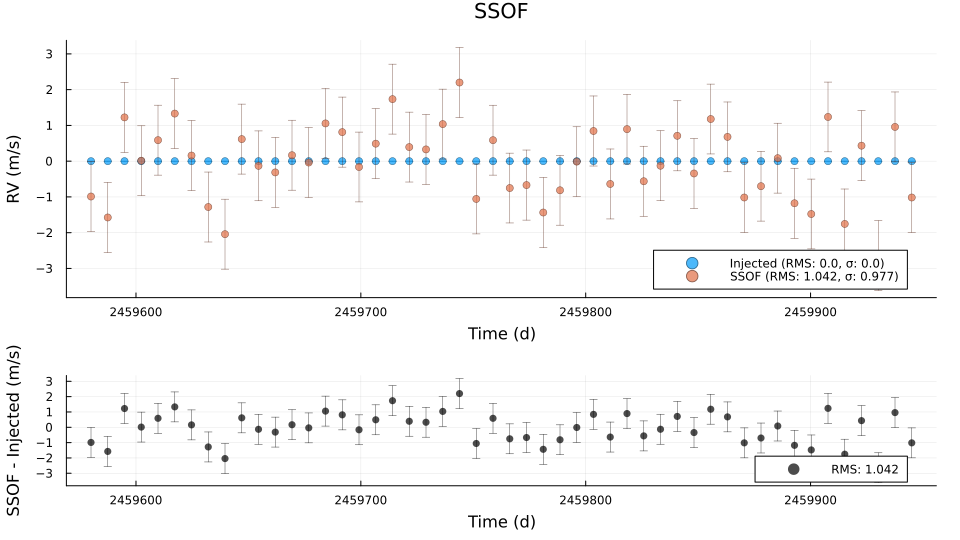

In [27]:
# how do our RV estimates look
plot_model_rvs(times, rvs, rvs_σ, times, injected_rvs, zeros(length(times)); title="SSOF", inst_str="Injected");

In [28]:
# how well did the model fit the data
plt = status_plot(mws; display_plot=false);

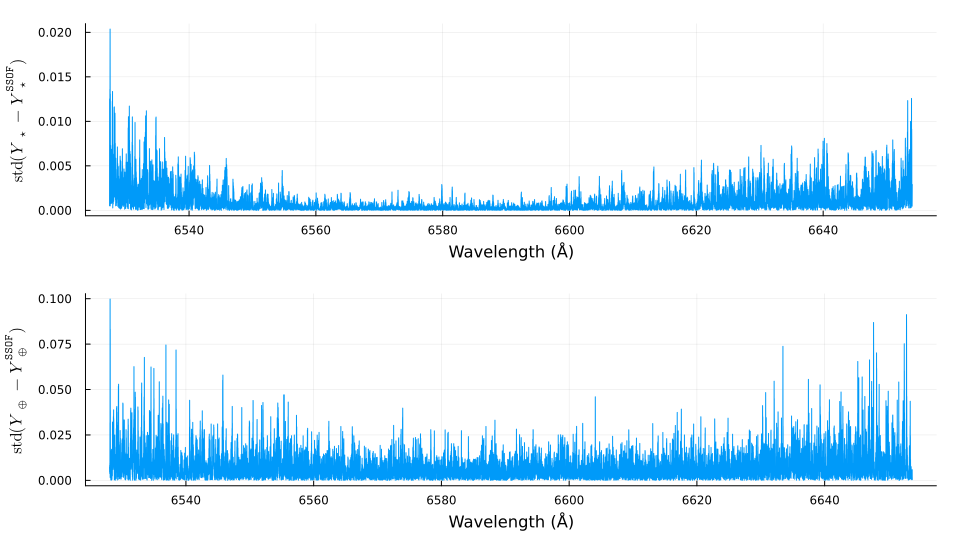

In [33]:
# how close is each model to recreating the noiseless version used to simulate the data
plt = _plot(; layout=grid(2, 1, heights=[0.5, 0.5]), size=(960, 540));
plot!(plt[1], model.star.λ, vec(std(_flux_stellar - model_new.star.lm(); dims=2)); label="", xlabel = "Wavelength (Å)", ylabel = L"\textrm{std}(Y_\star - Y_\star^{\texttt{SSOF}})");
plot!(plt[2], model.tel.λ, vec(std(flux_tellurics - model_new.tel.lm(); dims=2)); label="", xlabel = "Wavelength (Å)", ylabel = L"\textrm{std}(Y_\oplus - Y_\oplus^{\texttt{SSOF}})")

In [34]:
# how close is each template and feature vector to the source models
function compare_model_component(source, model, stellar::Bool; kwargs...)
	plt = _plot(; layout = grid(2, 1, heights=[0.75, 0.25]), kwargs...)
	stellar ? plot_f = plot_stellar_with_lsf! : plot_f = plot_telluric_with_lsf!
	plot_f(plt[1], model_new, source; d=data_simulated, label="Source", color=plt_colors[1], alpha=0.7, legend=:outerright, ylabel = "Continuum Normalized Flux + Const")
	plot_f(plt[1], model_new, model .- (maximum(model) - minimum(source)); d=data_simulated, label="Model", color=plt_colors[2], alpha=0.7)
	plot_f(plt[2], model_new, source .- model; d=data_simulated, label="", color=base_color, alpha=0.7, legend=:outerright, xlabel = "Wavelength (Å)", ylabel = "Residual", title="")
	return plt
end

# how close are the measuresd scores to the source scores
normalized(x) = (x .- mean(x)) / std(x)
function compare_model_score(source, model; kwargs...)
	plt = _plot(; layout = grid(2, 1, heights=[0.75, 0.25]), kwargs...)
	s = normalized(source)
	m = normalized(model)
	scatter!(plt[1], times, s; label="Source", alpha=0.7, legend=:outerright, ylabel = "Normalized Scores")
	scatter!(plt[1], times, m .- (maximum(m) - minimum(s)); label="Model", color=plt_colors[2], alpha=0.7)
	scatter!(plt[2], times, s .- m; label="", color=base_color, xlabel = "Wavelength (Å)", ylabel = "Residual", title="", legend=:outerright)
	return plt
end


compare_model_score (generic function with 1 method)

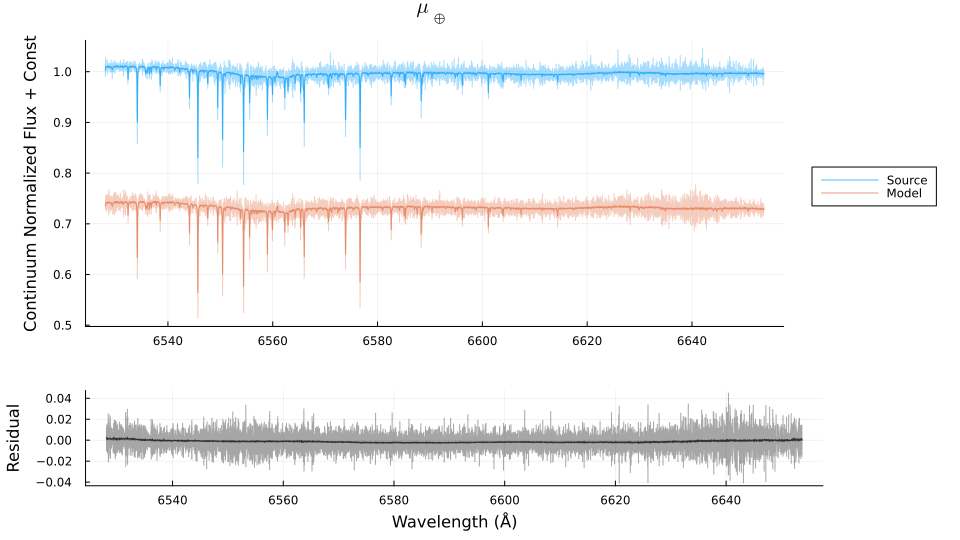

In [35]:
compare_model_component(model.tel.lm.μ,  model_new.tel.lm.μ, false; title=L"\mu_\oplus")

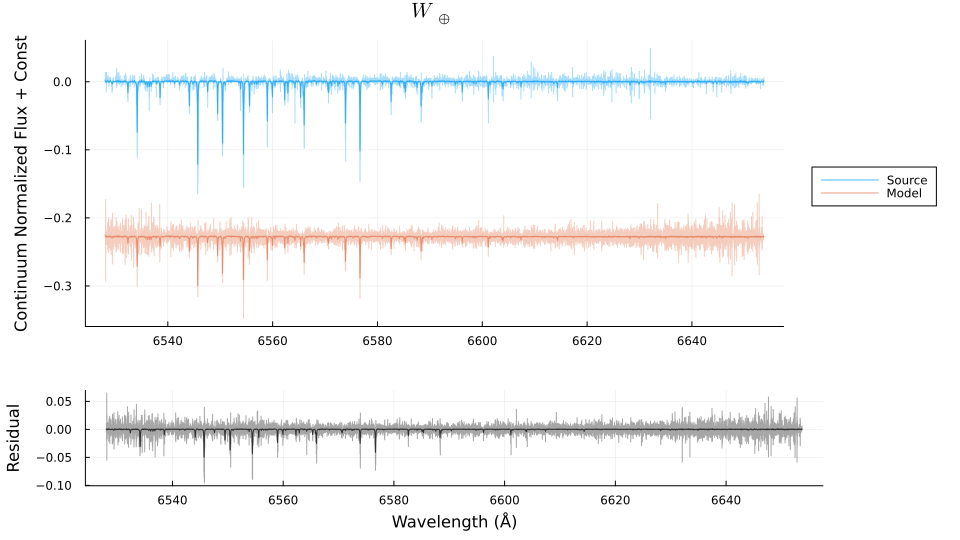

In [36]:
compare_model_component(model.tel.lm.M[:, 1] ./ norm(model.tel.lm.M[:, 1]),  model_new.tel.lm.M[:, 1] ./ norm(model_new.tel.lm.M[:, 1]), false; title=L"W_\oplus")

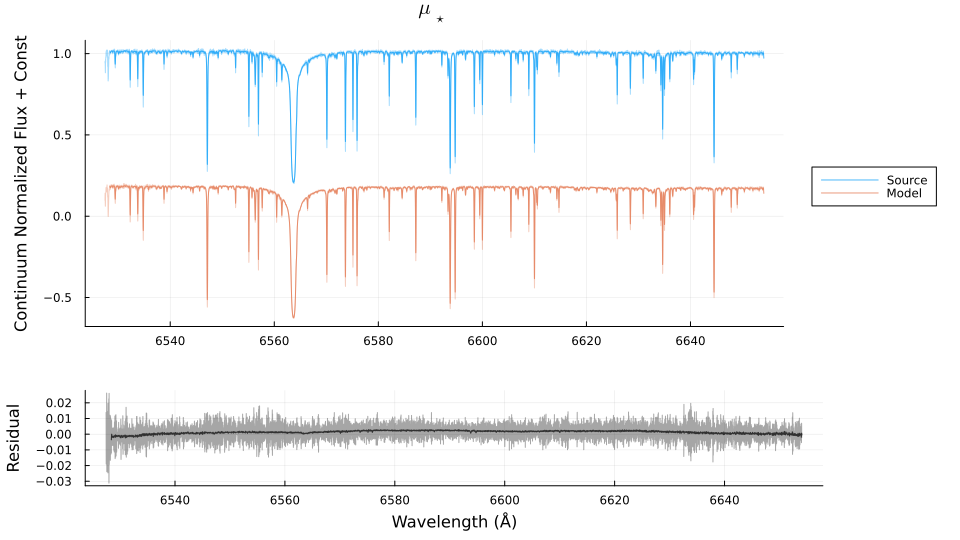

In [37]:
compare_model_component(model.star.lm.μ,  model_new.star.lm.μ, true; title=L"\mu_\star")

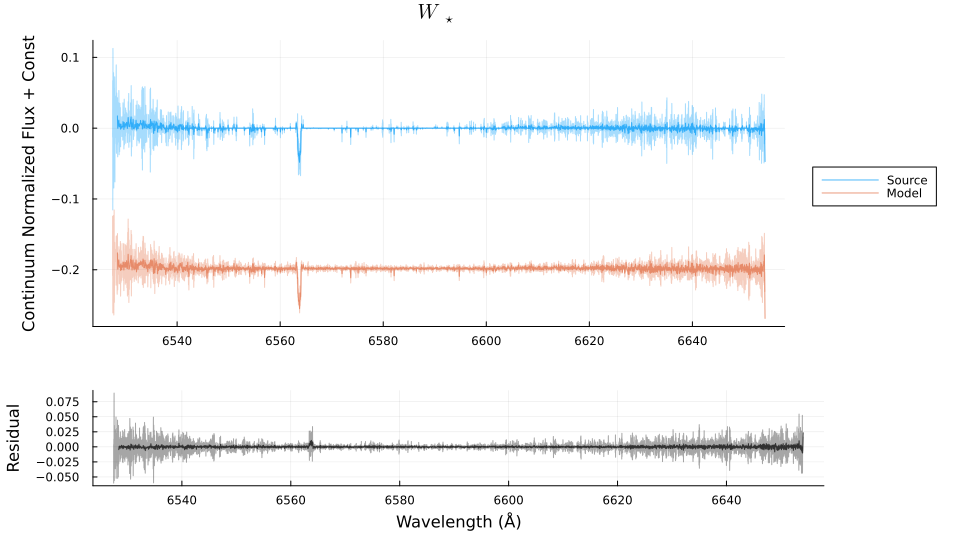

In [38]:
compare_model_component(model.star.lm.M[:, 1]./ norm(model.star.lm.M[:, 1]),  model_new.star.lm.M[:, 1]./ norm(model_new.star.lm.M[:, 1]), true; title=L"W_\star")

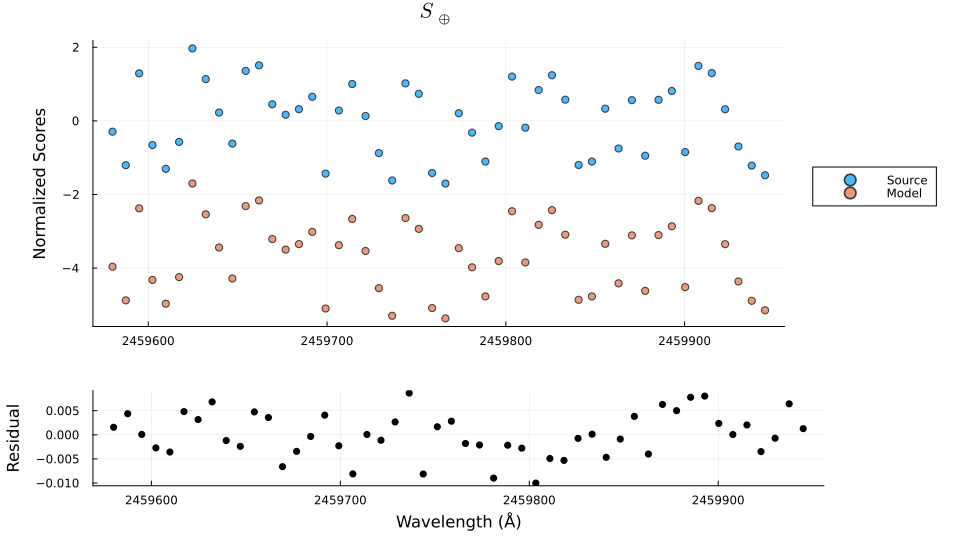

In [39]:
compare_model_score(model_scores_telluric', model_new.tel.lm.s'; title=L"S_\oplus")

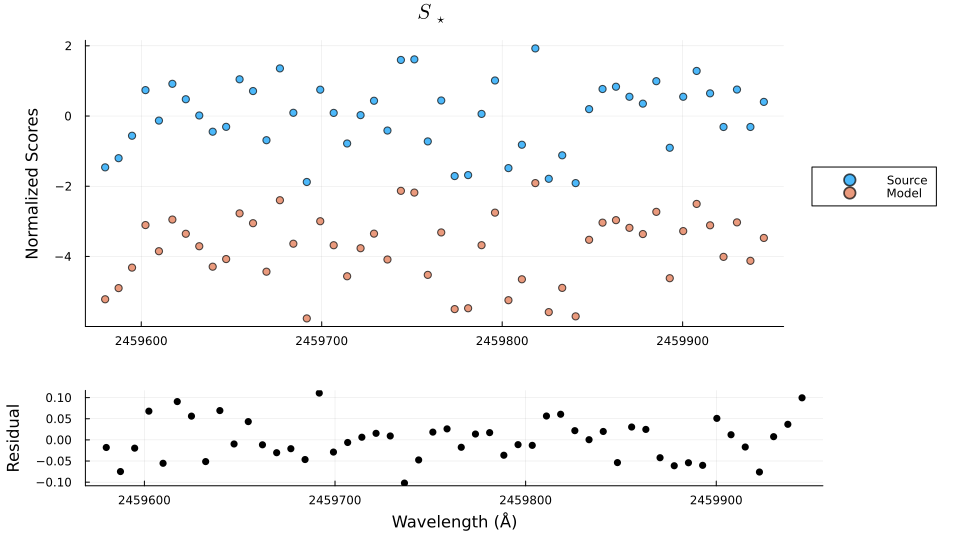

In [40]:
compare_model_score(model_scores_stellar', model_new.star.lm.s'; title=L"S_\star")